In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict, Counter

In [2]:
import pickle

In [3]:
from typing import List, Dict, Any, Tuple

In [4]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

In [5]:
import colorcet

In [6]:
import glob
from tqdm.notebook import tqdm
import json

In [7]:
from bertopic import BERTopic

In [8]:
# Set up LaTeX fonts
#plt.style.use(['no-latex'])
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams['text.usetex'] = True
#plt.rcParams['text.latex.unicode'] = True
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'Liberation Sans', 'Bitstream Vera Sans', 'sans-serif']

In [9]:
# read embedding dict from disk
embedding_file = "../data/doc_summary_embedding_dict.pkl"

with open(embedding_file, "rb") as file:
    doc2embedding: Dict[str, Dict] = pickle.load(file)

In [10]:
embeddings: np.array = np.array(
    [
        emb for emb in doc2embedding.values()
    ]
)

In [11]:
document_indexes: List[str] = [
    emb for emb in doc2embedding.keys()
]

In [12]:
# read articles from from yaml files
text_path = '../data/json_files/' 

# get all files in the path 
json_files: List[str] = glob.glob(text_path + '*.json')

doc_titles_dict: Dict[str, str] = defaultdict()
doc_tldr_dict: Dict[str, str] = defaultdict()
doc_topics_dict: Dict[str, List[str]] = defaultdict(list)

# read all json files
for file in json_files:
    with open(file, 'r') as f:
        article_json = json.load(f)

        doc_ID = file.split('/')[-1].split('.')[0]

        doc_titles_dict[doc_ID] = article_json['revised_title']
        doc_tldr_dict[doc_ID] = article_json['tldr']
        doc_topics_dict[doc_ID] = ' '.join(article_json['semantic_tags'])

In [13]:
doc_titles = [doc_titles_dict[i] for i in doc2embedding]
doc_topics = [doc_topics_dict[i] for i in doc2embedding]

In [14]:
tsne = TSNE(n_components=2, perplexity=100, random_state=42, verbose=True)

tsne_embeddings = tsne.fit_transform(embeddings)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 47558 samples in 0.007s...
[t-SNE] Computed neighbors for 47558 samples in 33.217s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47558
[t-SNE] Computed conditional probabilities for sample 2000 / 47558
[t-SNE] Computed conditional probabilities for sample 3000 / 47558
[t-SNE] Computed conditional probabilities for sample 4000 / 47558
[t-SNE] Computed conditional probabilities for sample 5000 / 47558
[t-SNE] Computed conditional probabilities for sample 6000 / 47558
[t-SNE] Computed conditional probabilities for sample 7000 / 47558
[t-SNE] Computed conditional probabilities for sample 8000 / 47558
[t-SNE] Computed conditional probabilities for sample 9000 / 47558
[t-SNE] Computed conditional probabilities for sample 10000 / 47558
[t-SNE] Computed conditional probabilities for sample 11000 / 47558
[t-SNE] Computed conditional probabilities for sample 12000 / 47558
[t-SNE] Computed conditional probabilities for s

In [15]:
# metadata_df = pd.read_csv('data/outputs/rsc_metadata_full.csv')
# metadata_df.head()

In [16]:
# get document titles from metadata

# document_titles: List[str] = []

# # TODO: this is very slow, should be optimized
# for doc_index in tqdm(document_indexes):
#     document_titles.append(
#         metadata_df.loc[
#             metadata_df['id'] == doc_index
#         ]['title'].values[0]
#     )



In [17]:
# document_titles_2 = [
#     str(document_indexes[i]) + ' ' + title  for i, title in enumerate(document_titles)
# ]

In [84]:
topic_model = BERTopic(
    verbose=True,
    min_topic_size=25,
    #nr_topics=100,
    calculate_probabilities=True,
    #n_gram_range=(1,2),
    #nr_topics="auto",
)

In [85]:
topics, probs = topic_model.fit_transform(
    doc_topics, 
    embeddings,
)

2024-11-19 18:32:16,265 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-19 18:32:52,075 - BERTopic - Dimensionality - Completed ✓
2024-11-19 18:32:52,077 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-11-19 18:34:53,075 - BERTopic - Cluster - Completed ✓
2024-11-19 18:34:53,084 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-11-19 18:34:53,524 - BERTopic - Representation - Completed ✓


In [91]:
# Reduce outliers
topics = topic_model.reduce_outliers(doc_topics, topics)
topic_model.update_topics(doc_titles, topics=topics)

topic_set = set(topics)

color_set = sns.color_palette(
    colorcet.glasbey,
    n_colors=len(topic_set)
)

topic2color = {
    topic: color
    for topic, color in zip(topic_set, color_set)
}

topic2color[-1] = (0.6, 0.6, 0.6)

topic_names = topic_model.get_topic_info()['Name'].values

# topic2name = {
#     int(t_name[:t_name.find('_')]): t_name
#     for t_name in topic_names
# }

  0%|          | 0/20 [00:00<?, ?it/s]

100%|██████████| 20/20 [00:00<00:00, 27.17it/s]
2024-11-19 18:37:29,635 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [92]:
# for d, s, t, p in zip(document_indexes, summaries, topics, probs):
#     print(f"Id: {d}")
#     print(f"Summary: {s}")
#     print(f"Topic: {t}")
#     print(f"Probabilities: {p}")

In [93]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,984,0_flow_fluid_viscous_flows,"[flow, fluid, viscous, flows, boundary, vortex...",[Fluid dynamics Magnetohydrodynamics Stability...
1,1,891,1_relativity_gravitational_quantum_relativistic,"[relativity, gravitational, quantum, relativis...",[Relativity Quantum mechanics Gravitational fi...
2,2,602,2_magnetic_magnetism_diurnal_declination,"[magnetic, magnetism, diurnal, declination, te...",[Geomagnetism Surveying Terrestrial magnetism ...
3,3,536,3_continental_mantle_crust_rocks,"[continental, mantle, crust, rocks, tectonic, ...",[Continental crust Plate tectonics Chemical bo...
4,4,552,4_case_treatment_stone_bladder,"[case, treatment, stone, bladder, surgical, un...",[Urology Kidney stones Bladder surgery Medical...
...,...,...,...,...,...
320,320,43,320_solomon_islands_hebrides_kinabalu,"[solomon, islands, hebrides, kinabalu, protect...",[Forest Ecology Agathis obtusa Kauri forests N...
321,321,34,321_projectiles_projectile_rifled_ballistics,"[projectiles, projectile, rifled, ballistics, ...",[Fluid dynamics Ballistics Aerodynamics Projec...
322,322,171,322_gene_expression_storage_genes,"[gene, expression, storage, genes, seed, droso...",[Plant Genetics Seed Proteins Gene Expression ...
323,323,91,323_sorption_thermodynamics_zeolites_intracrys...,"[sorption, thermodynamics, zeolites, intracrys...",[Zeolites Sorption Gas adsorption Silicalite C...


In [94]:
hierarchical_topics = topic_model.hierarchical_topics(doc_titles)

100%|██████████| 324/324 [00:00<00:00, 366.80it/s]


In [95]:
# article_titles = [
#     doc2json[doc]["article_id"] + ': ' + doc2json[doc]["revised_title"] + '. Keyterms: ' + ', '.join(doc2json[doc]["topics"])
#     for doc in document_indexes
# ]

topic_model.visualize_documents(doc_titles, reduced_embeddings=tsne_embeddings)

In [96]:
doc2topic = {
    doc: topic
    for doc, topic in zip(document_indexes, topics)
}

In [77]:
doc2topic['101405']

-1

In [78]:
# topic_model.get_document_info(doc_titles)

In [97]:
topic_model.visualize_heatmap()

In [98]:
#print(topic_model.get_topic_tree(hierarchical_topics))

In [99]:
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

In [100]:
topic_model.visualize_barchart(top_n_topics=325, n_words=10)

In [102]:
for doc, topic in zip(document_indexes, topics):
    if topic == 58:
        #print(f"Document: {doc}")
        #print(f"Topic: {topic}")
        print(f"Title: {doc_titles_dict[doc]}")
        print(f"TL;DR: {doc_tldr_dict[doc]}")
        print(f"Topics: {doc_topics_dict[doc]}")
        print("\n")

Title: Latitudinal Gradient in Human Languages Density in North America
TL;DR: The authors discovered a latitudinal gradient in the density of human languages in North America, with six times more languages spoken in southern latitudes compared to the poles. They also found that the geographic range of human language groups increased with latitude, conforming to Rapaport's rule. This study sheds light on the ecological factors associated with linguistic and cultural evolution.
Topics: Linguistics Anthropology Cultural Evolution Language Ecology Geography


Title: The Neuropsychology of Lipreading: Understanding the Intersection of Sensory and Cognitive Processes
TL;DR: This article explores the neuropsychology of lipreading, examining how it intersects with sensory and cognitive processes. It discusses the role of the right and left hemispheres in lipreading and face perception, and how different cognitive components of lipreading can be inferred from dissociations on various lipreadin

In [33]:
topic2label = {
    int(t_lable.split()[0]): ', '.join(t_lable.split()[0:])
    for t_lable in topic_model.generate_topic_labels(
        nr_words=20, 
        separator=" "
    )
}

topic2label

{-1: '-1, bicoeca, reexamination, classification, species, and, of',
 0: '0, pioneering, royal, society, science, life, contributions, scientific, john, obituary, william',
 1: '1, magnetic, magnetism, diurnal, compass, terrestrial, declination, variation, needle, disturbances, sunspot',
 2: '2, flow, fluid, vortex, boundary, viscous, flows, stability, rotating, layer, layers',
 3: '3, specific, viscosity, steam, heat, heats, mixtures, vapour, condensation, gas, gases',
 4: '4, case, treatment, stone, surgical, bladder, medical, unusual, successful, stones, monstrous',
 5: '5, barometer, meteorological, weather, atmospheric, barometric, rainfall, observations, lyndon, thermometer, rutland',
 6: '6, continental, mantle, crust, earths, tectonic, rocks, evolution, geological, lithosphere, margins',
 7: '7, relativity, gravitational, general, black, spacetime, spacetimes, field, gravitation, fields, einsteins',
 8: '8, channels, calcium, acetylcholine, receptor, sodium, muscle, oocytes, re

In [34]:
def get_category_centroids(
        embeddings_2D: np.array, # 2D tsne embeddings
        category_list: List[str]           # list of categories
    ) -> Dict[str, np.array]:    # return dict of category centroids

    cateogry_embeddings = defaultdict(list)

    for cat, tsne_emb in zip(category_list, embeddings_2D):
        cateogry_embeddings[cat].append(tsne_emb)

    category_centroids = {}

    for cat, embeddings in cateogry_embeddings.items():
        centroid = np.median(embeddings, axis=0)
        category_centroids[cat] = centroid

    return category_centroids

In [35]:
def plot_embedding_2D(
        embeddings_2D: np.array, # 2D tsne embeddings
        category_list: List[str],          # list of categories 
        with_captions: bool = True         # show category captions  
    ) -> None:                             # show plot, return None  


    colors: Dict[str, str] = [
        topic2color[cat] for cat in category_list
    ]
    
    # Create a scatter plot to visualize the t-SNE embeddings
    plt.figure(figsize=(12, 12))

    scatter = plt.scatter(
        embeddings_2D[:, 0], 
        embeddings_2D[:, 1], 
        alpha=0.25, 
        c=colors,
        marker='o',
        s=18
    )

    category_centroids = get_category_centroids(
        embeddings_2D, 
        category_list
    )


    handles = [
        plt.Line2D(
            [],
            [],
            marker='o',
            color=topic2color[cat], 
            linestyle='', 
            markersize=8,
            label=topic2label[cat]
        ) for cat in sorted(list(category_centroids.keys())) 
        if cat != 'Other'
    ]

    if with_captions:

        for cat, centroid in category_centroids.items():

            if cat == "Other":
                continue

            #rand_int = random.randint(-5, 5)

            plt.text(
                centroid[0], #- 15, 
                centroid[1], #- rand_int, 
                cat, #r"${{{}}}$".format(category2text[cat]), 
                fontdict=dict(fontsize=24, fontweight='normal', color='black'), 
                bbox=dict(
                    facecolor=topic2color[cat], 
                    alpha=0.5, 
                    linewidth=0, 
                    boxstyle='round,pad=0.1'
                    )
                )

    plt.legend(
        handles=handles, 
        title="", 
        fontsize=18, 
        framealpha=0,
        #loc='lower center',
        loc='upper left', 
        #bbox_to_anchor=(0.5, -0.25), 
        bbox_to_anchor=(1, 1), 
        #ncols=3,
        ncols=1,
    )


    plt.title('t-SNE projections', fontsize=16)
    #plt.xlabel('t-SNE Dimension 1')
    #plt.ylabel('t-SNE Dimension 2')
    #plt.ylim(-100, 100)
    #plt.xlim(-110, 110)

    plt.show()    

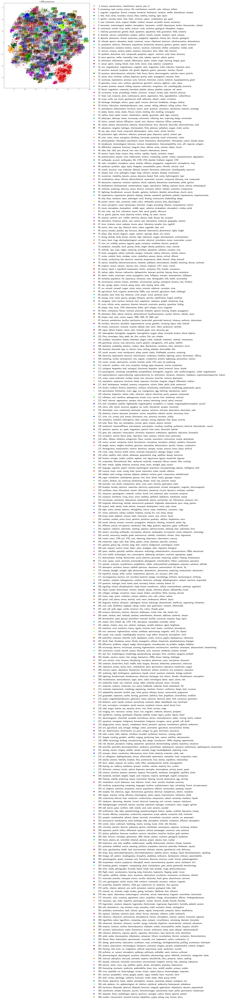

In [36]:
plot_embedding_2D(tsne_embeddings, topics, with_captions=True)

In [ ]:

# read the metadat file into a pandas dataframe
metadata_file = '../data/Royal_Society_Corpus_open_v6.0_meta.tsv'

metadata_df = pd.read_csv(metadata_file, delimiter='\t')

metadata_df.head()

In [ ]:
# add year, decade, and period to the dictionaries in doc2json

for doc in tqdm(doc2json):
    df_row = metadata_df.loc[metadata_df['id'] == doc]
    year = df_row['year'].values[0]
    decade = df_row['decade'].values[0]
    period = df_row['period'].values[0]

    doc2json[doc]['year'] = year
    doc2json[doc]['decade'] = decade
    doc2json[doc]['period'] = period

In [ ]:
decades = [
    doc2json[doc]['decade'] for doc in document_indexes
]

In [ ]:

topics_over_time = topic_model.topics_over_time(topic_sentences, decades)

topic_model.visualize_topics_over_time(topics_over_time, topics=[15, 40, 42, 62])